# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [1]:
data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
#data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Found mnist Data
Found celeba Data


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

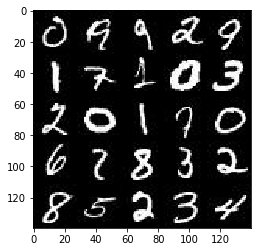

In [2]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

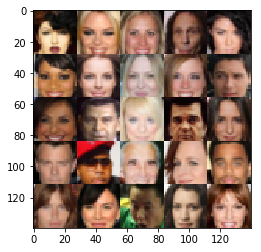

In [3]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [4]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.1.0
Default GPU Device: /gpu:0


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [5]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    # TODO: Implement Function
    
    input_real = tf.placeholder(dtype=tf.float32, shape =(None, image_width, image_height, image_channels), name = "input_real")
    
    input_z = tf.placeholder(dtype=tf.float32, shape = (None, z_dim), name = "input_z")
    lr = tf.placeholder(dtype=tf.float32, name = "learning_rate")

    return input_real, input_z, lr


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

Tests Passed


### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the discriminator, tensor logits of the discriminator).

In [6]:
def discriminator(images, reuse=False):
    """
    Create the discriminator network
    :param images: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    # TODO: Implement Function
    alpha = 0.1
    
    with tf.variable_scope("discriminator", reuse=reuse):
        # Fully connected layer
        # Input layer is 28x28x3
        ly_1 = tf.layers.conv2d(images, 64, 5, strides=2, padding='same', kernel_initializer=tf.contrib.layers.xavier_initializer())
        l_relu_1 = tf.maximum(alpha * ly_1, ly_1)
        l_relu_1 = tf.layers.dropout(l_relu_1, rate= 0.6)
        # 14x14x64
        
        ly_2 = tf.layers.conv2d(l_relu_1, 128, 5, strides=2, padding='same', kernel_initializer=tf.contrib.layers.xavier_initializer())
        ly_2 = tf.layers.batch_normalization(ly_2, training=True)
        l_relu_2 = tf.maximum(alpha * ly_2, ly_2)
        l_relu_2 = tf.layers.dropout(l_relu_2, rate= 0.6)
        # 7x7x128
        
        ly_3 = tf.layers.conv2d(l_relu_2, 256, 5, strides=2, padding='same', kernel_initializer=tf.contrib.layers.xavier_initializer())
        ly_3 = tf.layers.batch_normalization(ly_3, training=True)
        l_relu_3 = tf.maximum(alpha * ly_3, ly_3)
        l_relu_3 = tf.layers.dropout(l_relu_3, rate= 0.6)
        # 4x4x256
        
        # Flatten it
        flat = tf.reshape(l_relu_3, (-1, 4*4*256))
        logits = tf.layers.dense(flat, 1, kernel_initializer=tf.contrib.layers.xavier_initializer())
        output = tf.sigmoid(logits)
    
    return logits, output


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [7]:
def generator(z, out_channel_dim, is_train=True):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    # TODO: Implement Function
    alpha = 0.1
    
    with tf.variable_scope("generator", reuse = not is_train):
        # Fully connected layer
        ly_1 = tf.layers.dense(z, 7*7*512, kernel_initializer=tf.contrib.layers.xavier_initializer())
        # Reshape it to start the convolutional stack
        ly_1 = tf.reshape(ly_1, (-1, 7, 7, 512))
        ly_1 = tf.layers.batch_normalization(ly_1, training=is_train)
        ly_1 = tf.maximum(alpha * ly_1, ly_1)
        ly_1 = tf.layers.dropout(ly_1, rate= 0.5, training= is_train)
        
        # Using convolutional layers
        ly_c_2 = tf.layers.conv2d_transpose(ly_1, 128, 5, strides=2, padding='same', kernel_initializer=tf.contrib.layers.xavier_initializer())
        ly_c_2 = tf.layers.batch_normalization(ly_c_2, training=is_train)
        ly_c_2 = tf.maximum(alpha * ly_c_2, ly_c_2)
        ly_c_2 = tf.layers.dropout(ly_c_2, rate= 0.5, training= is_train)
        
        # Second convolutional layer
        ly_c_3 = tf.layers.conv2d_transpose(ly_c_2, 64, 5, strides=2, padding='same', kernel_initializer=tf.contrib.layers.xavier_initializer())
        ly_c_3 = tf.layers.batch_normalization(ly_c_3, training=is_train)
        ly_c_3 = tf.maximum(alpha * ly_c_3, ly_c_3)
        ly_c_3 = tf.layers.dropout(ly_c_3, rate= 0.5, training= is_train)
        
        # Output layer
        logits = tf.layers.conv2d_transpose(ly_c_2, out_channel_dim, 5, strides=2, padding='same', kernel_initializer=tf.contrib.layers.xavier_initializer())
        
        
        out = tf.tanh(logits)
    
    return out


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [8]:
import numpy as np
def model_loss(input_real, input_z, out_channel_dim):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    # TODO: Implement Function
    # Create the model for generator and discriminator
    g_model = generator(input_z, out_channel_dim)
    # Models for the discriminator, both for the real an fake model
    d_model_real, d_logits_real = discriminator(input_real)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True)
    
    # We want to minimize the diference of the loss for the fake and the real images.
    # Also applying label smoothing
    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, 
                                                labels=tf.ones_like(d_model_real) * np.random.uniform(0.7, 1.2)))
    d_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, 
                                                labels=tf.ones_like(d_model_fake) * np.random.uniform(0.0, 0.3)))
    
    g_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_model_fake)))

    d_loss = d_loss_real + d_loss_fake
    
    return d_loss, g_loss


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [9]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # TODO: Implement Function
    
    training_vars = tf.trainable_variables()
    
    d_vars = [var for var in training_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in training_vars if var.name.startswith('generator')]
    
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)

    return d_train_opt, g_train_opt


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [10]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [11]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    # TODO: Build Model
    
    n, image_width, image_height, image_channels = data_shape
    
    input_real, input_z, lr = model_inputs(image_width, image_height, image_channels, z_dim)
    
    d_loss , g_loss = model_loss(input_real, input_z, image_channels)
    
    d_opt, g_opt = model_opt(d_loss, g_loss, learning_rate, beta1)
    
    steps = 0
    print("Initializations ready...")
    
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            for batch_images in get_batches(batch_size):
                # TODO: Train Model
                steps +=1
                batch_images = batch_images * 2
                
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))
                
                # Run optimizers
                _ = sess.run(d_opt, feed_dict={input_real: batch_images, input_z: batch_z})
                _ = sess.run(g_opt, feed_dict={input_z: batch_z, input_real: batch_images})
                _ = sess.run(g_opt, feed_dict={input_z: batch_z, input_real: batch_images})

                if steps % 100 == 0: # Every 100 batches
                    # Print the losses every 100 batches
                    train_loss_d = d_loss.eval({input_z: batch_z, input_real: batch_images})
                    train_loss_g = g_loss.eval({input_z: batch_z})

                    print("Epoch {}/{}...".format(epoch_i+1, epoch_count),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))
                    
                if steps % 100 == 0:
                    gen_samples = sess.run(
                                   generator(input_z, image_channels, is_train = False),
                                   feed_dict={input_z: batch_z})
                    
                    show_generator_output(sess, 25, input_z, image_channels, data_image_mode)
    
    pass
                
                

### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

Initializations ready...
Epoch 1/2... Discriminator Loss: 1.0833... Generator Loss: 0.6754


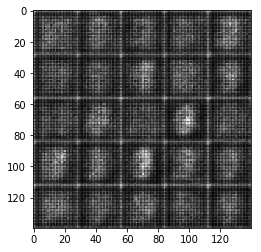

Epoch 1/2... Discriminator Loss: 1.0609... Generator Loss: 0.6775


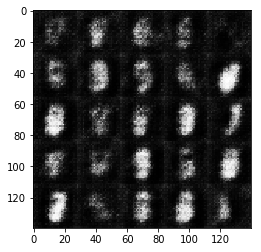

Epoch 1/2... Discriminator Loss: 1.2414... Generator Loss: 0.4314


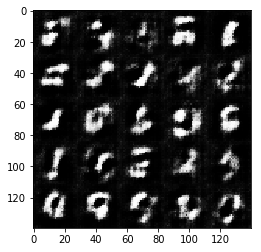

Epoch 1/2... Discriminator Loss: 1.1800... Generator Loss: 0.6793


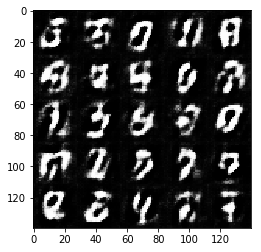

Epoch 1/2... Discriminator Loss: 1.2113... Generator Loss: 0.4719


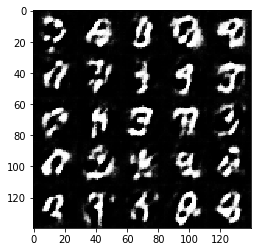

Epoch 1/2... Discriminator Loss: 1.1454... Generator Loss: 0.5575


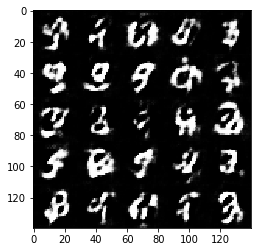

Epoch 1/2... Discriminator Loss: 1.0915... Generator Loss: 0.6715


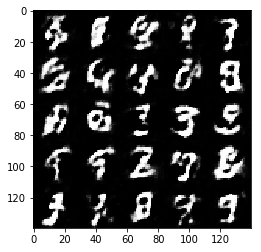

Epoch 1/2... Discriminator Loss: 1.0909... Generator Loss: 0.6485


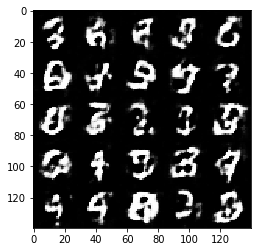

Epoch 1/2... Discriminator Loss: 1.1096... Generator Loss: 0.6596


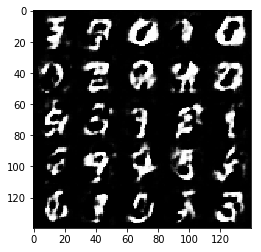

Epoch 1/2... Discriminator Loss: 1.0882... Generator Loss: 0.6562


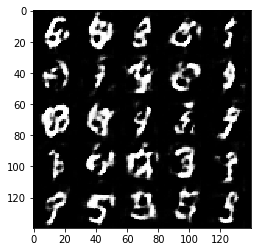

Epoch 1/2... Discriminator Loss: 1.0879... Generator Loss: 0.6805


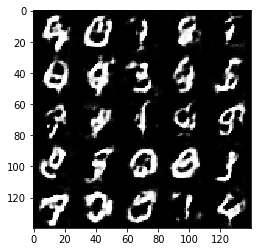

Epoch 1/2... Discriminator Loss: 1.1022... Generator Loss: 0.5954


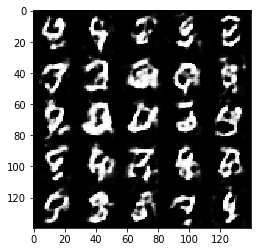

Epoch 1/2... Discriminator Loss: 1.1215... Generator Loss: 0.5601


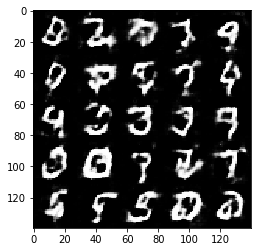

Epoch 1/2... Discriminator Loss: 1.0728... Generator Loss: 0.6603


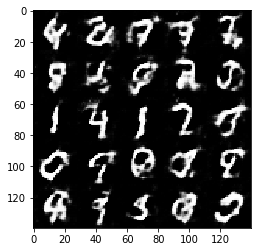

Epoch 1/2... Discriminator Loss: 1.0796... Generator Loss: 0.6778


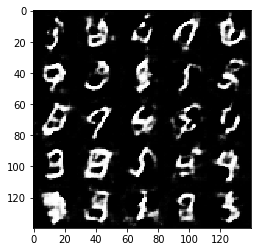

Epoch 1/2... Discriminator Loss: 1.0703... Generator Loss: 0.6525


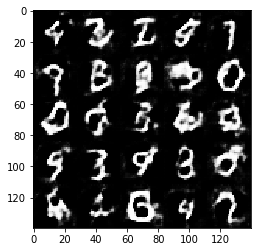

Epoch 1/2... Discriminator Loss: 1.2349... Generator Loss: 0.4639


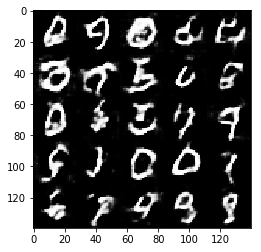

Epoch 1/2... Discriminator Loss: 1.1618... Generator Loss: 0.6680


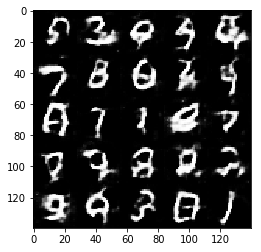

Epoch 2/2... Discriminator Loss: 1.1865... Generator Loss: 0.5184


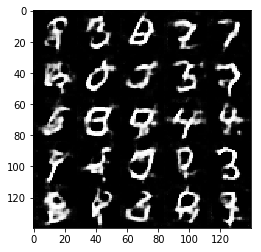

Epoch 2/2... Discriminator Loss: 1.0883... Generator Loss: 0.6642


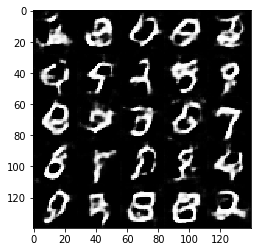

Epoch 2/2... Discriminator Loss: 1.0841... Generator Loss: 0.6717


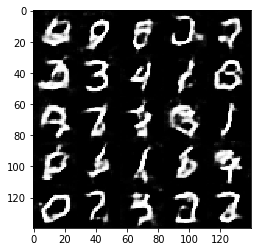

Epoch 2/2... Discriminator Loss: 1.0772... Generator Loss: 0.6510


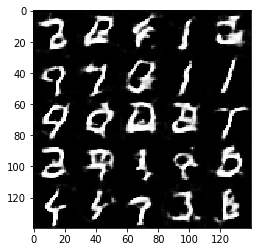

Epoch 2/2... Discriminator Loss: 1.1484... Generator Loss: 0.5734


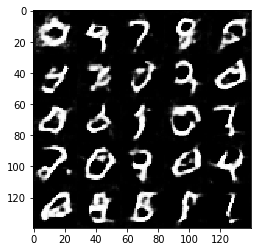

Epoch 2/2... Discriminator Loss: 1.1288... Generator Loss: 0.6908


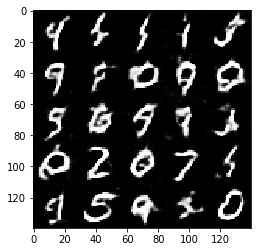

Epoch 2/2... Discriminator Loss: 1.0809... Generator Loss: 0.6621


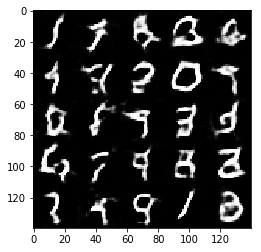

Epoch 2/2... Discriminator Loss: 1.2599... Generator Loss: 0.3777


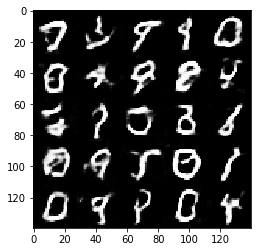

Epoch 2/2... Discriminator Loss: 1.0779... Generator Loss: 0.6801


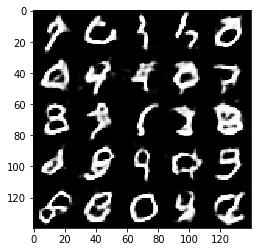

Epoch 2/2... Discriminator Loss: 1.1827... Generator Loss: 0.5209


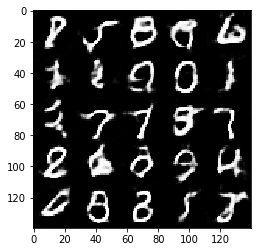

Epoch 2/2... Discriminator Loss: 1.2901... Generator Loss: 0.4215


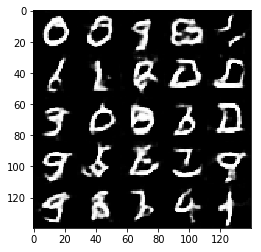

Epoch 2/2... Discriminator Loss: 1.0700... Generator Loss: 0.6587


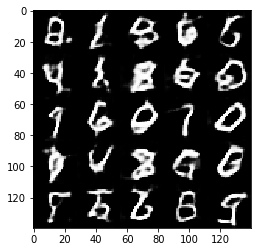

Epoch 2/2... Discriminator Loss: 1.1028... Generator Loss: 0.6841


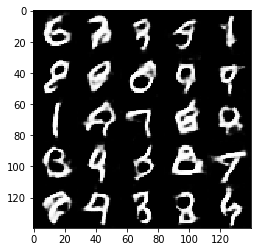

Epoch 2/2... Discriminator Loss: 1.0978... Generator Loss: 0.6504


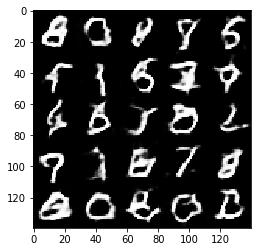

Epoch 2/2... Discriminator Loss: 1.0960... Generator Loss: 0.6728


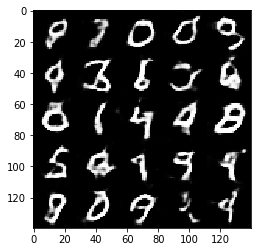

Epoch 2/2... Discriminator Loss: 1.0749... Generator Loss: 0.6594


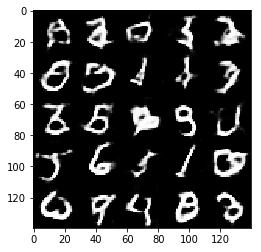

Epoch 2/2... Discriminator Loss: 1.0631... Generator Loss: 0.6705


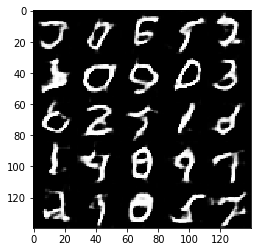

Epoch 2/2... Discriminator Loss: 1.1089... Generator Loss: 0.6416


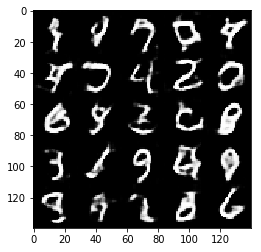

Epoch 2/2... Discriminator Loss: 1.1901... Generator Loss: 0.4843


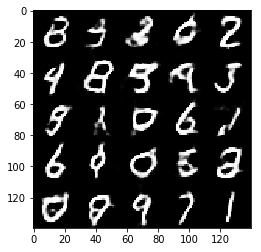

In [64]:
batch_size = 32
z_dim = 100
learning_rate = 0.00005
beta1 = 0.1


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

Initializations ready...
Epoch 1/2... Discriminator Loss: 0.9504... Generator Loss: 0.6507


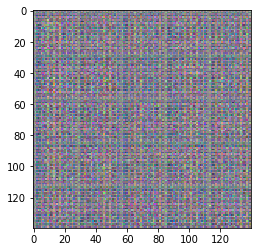

Epoch 1/2... Discriminator Loss: 0.9293... Generator Loss: 0.6740


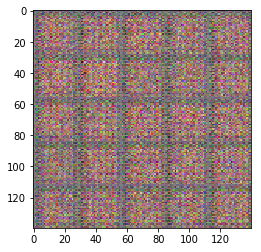

Epoch 1/2... Discriminator Loss: 0.9146... Generator Loss: 0.6791


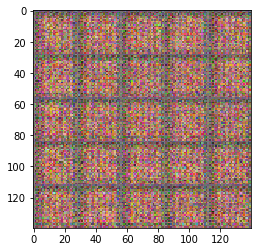

Epoch 1/2... Discriminator Loss: 0.9100... Generator Loss: 0.6880


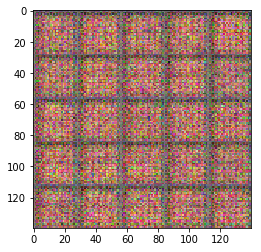

Epoch 1/2... Discriminator Loss: 0.9139... Generator Loss: 0.6874


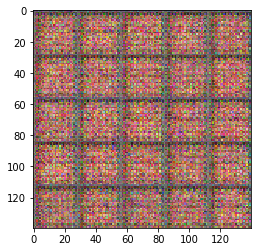

Epoch 1/2... Discriminator Loss: 0.9169... Generator Loss: 0.6889


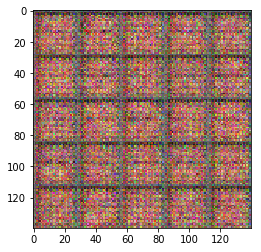

Epoch 1/2... Discriminator Loss: 0.9101... Generator Loss: 0.6900


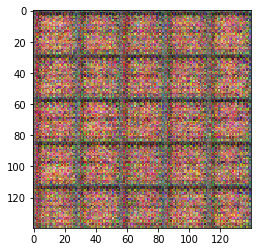

Epoch 1/2... Discriminator Loss: 0.9072... Generator Loss: 0.6911


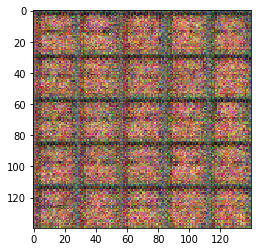

Epoch 1/2... Discriminator Loss: 0.9128... Generator Loss: 0.6906


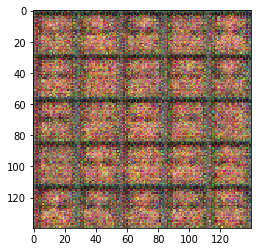

Epoch 1/2... Discriminator Loss: 0.9061... Generator Loss: 0.6914


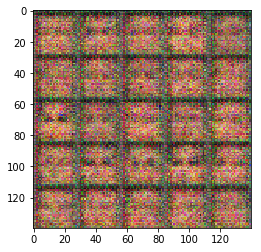

Epoch 1/2... Discriminator Loss: 0.9062... Generator Loss: 0.6912


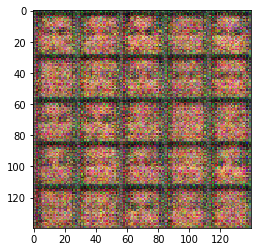

Epoch 1/2... Discriminator Loss: 0.9069... Generator Loss: 0.6914


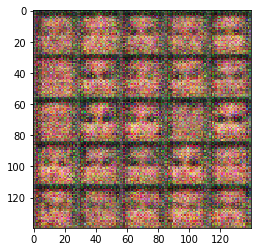

Epoch 1/2... Discriminator Loss: 0.9072... Generator Loss: 0.6916


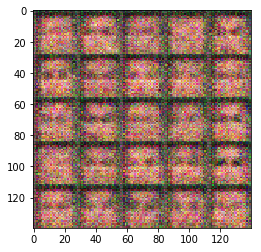

Epoch 1/2... Discriminator Loss: 0.9065... Generator Loss: 0.6923


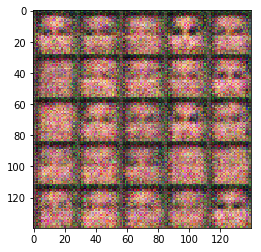

Epoch 1/2... Discriminator Loss: 0.9065... Generator Loss: 0.6921


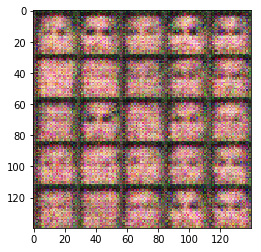

Epoch 1/2... Discriminator Loss: 0.9076... Generator Loss: 0.6919


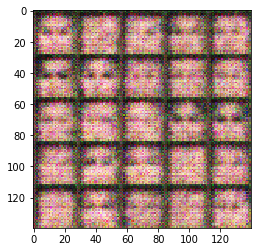

Epoch 1/2... Discriminator Loss: 0.9074... Generator Loss: 0.6921


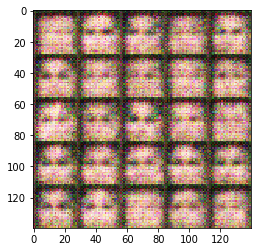

Epoch 1/2... Discriminator Loss: 0.9054... Generator Loss: 0.6922


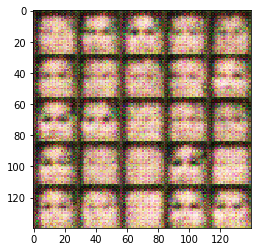

Epoch 1/2... Discriminator Loss: 0.9055... Generator Loss: 0.6922


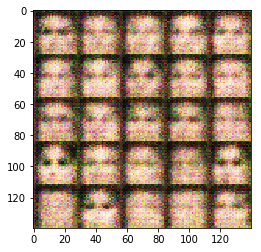

Epoch 1/2... Discriminator Loss: 0.9062... Generator Loss: 0.6921


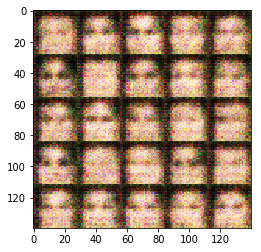

Epoch 1/2... Discriminator Loss: 0.9066... Generator Loss: 0.6907


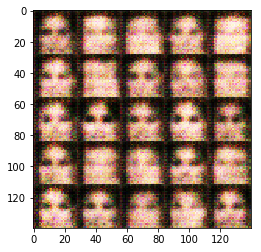

Epoch 1/2... Discriminator Loss: 0.9076... Generator Loss: 0.6888


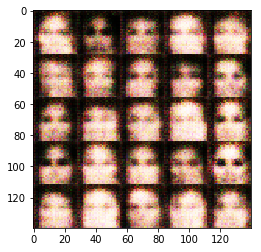

Epoch 1/2... Discriminator Loss: 0.9146... Generator Loss: 0.6867


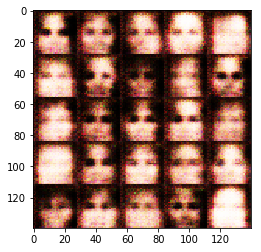

Epoch 1/2... Discriminator Loss: 0.9113... Generator Loss: 0.6881


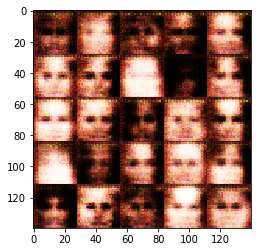

Epoch 1/2... Discriminator Loss: 0.9186... Generator Loss: 0.6835


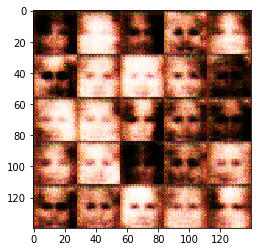

Epoch 1/2... Discriminator Loss: 0.9204... Generator Loss: 0.6862


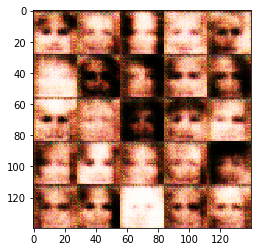

Epoch 1/2... Discriminator Loss: 0.9107... Generator Loss: 0.6869


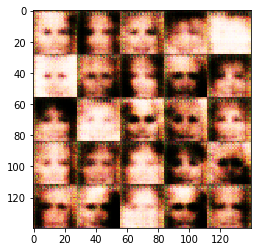

Epoch 1/2... Discriminator Loss: 0.9098... Generator Loss: 0.6911


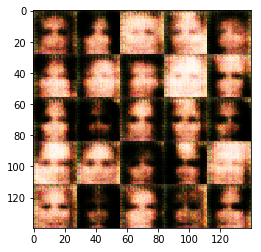

Epoch 1/2... Discriminator Loss: 0.9101... Generator Loss: 0.6837


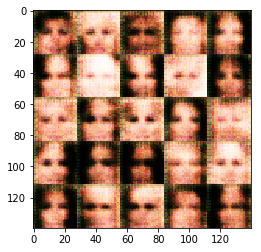

Epoch 1/2... Discriminator Loss: 0.9093... Generator Loss: 0.6892


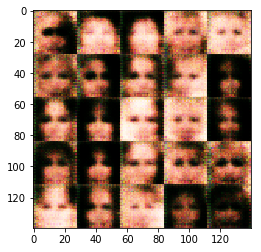

Epoch 1/2... Discriminator Loss: 0.9107... Generator Loss: 0.6883


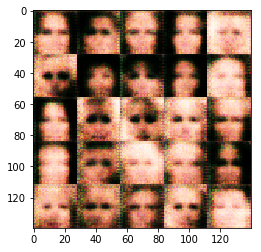

Epoch 1/2... Discriminator Loss: 0.9144... Generator Loss: 0.6864


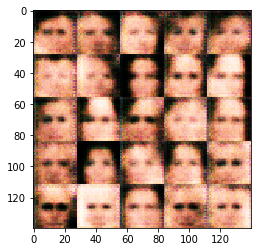

Epoch 1/2... Discriminator Loss: 0.9064... Generator Loss: 0.6893


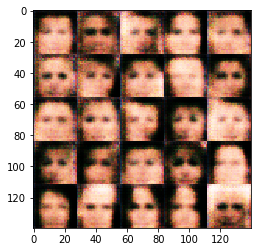

Epoch 1/2... Discriminator Loss: 0.9104... Generator Loss: 0.6901


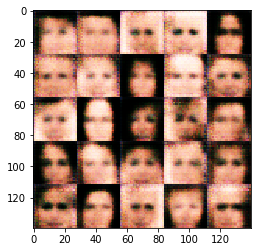

Epoch 1/2... Discriminator Loss: 0.9087... Generator Loss: 0.6898


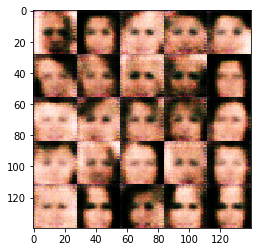

Epoch 1/2... Discriminator Loss: 0.9070... Generator Loss: 0.6906


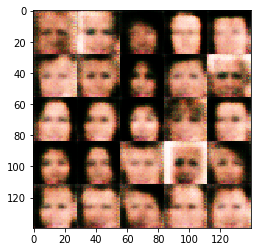

Epoch 1/2... Discriminator Loss: 0.9134... Generator Loss: 0.6862


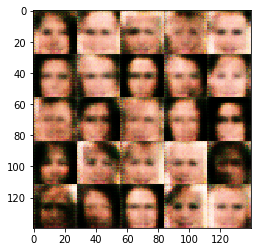

Epoch 1/2... Discriminator Loss: 0.9135... Generator Loss: 0.6889


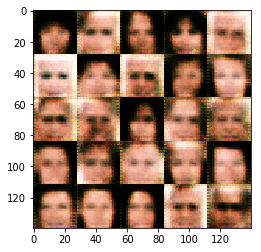

Epoch 1/2... Discriminator Loss: 0.9087... Generator Loss: 0.6892


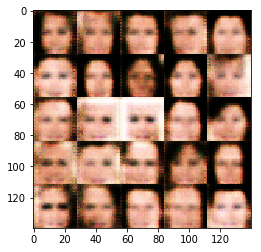

Epoch 1/2... Discriminator Loss: 0.9069... Generator Loss: 0.6907


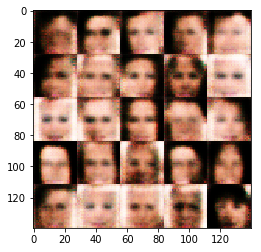

Epoch 1/2... Discriminator Loss: 0.9154... Generator Loss: 0.6886


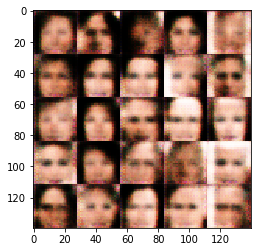

Epoch 1/2... Discriminator Loss: 0.9072... Generator Loss: 0.6898


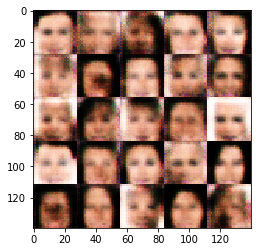

Epoch 1/2... Discriminator Loss: 0.9084... Generator Loss: 0.6920


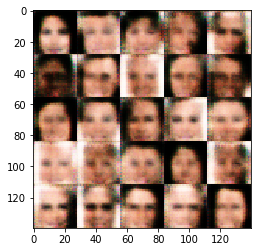

Epoch 1/2... Discriminator Loss: 0.9088... Generator Loss: 0.6882


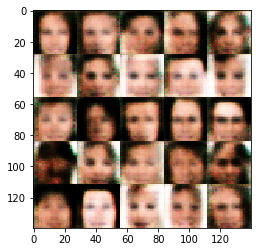

Epoch 1/2... Discriminator Loss: 0.9076... Generator Loss: 0.6904


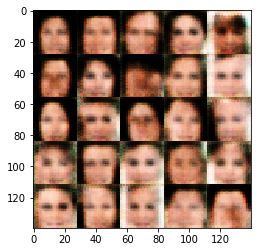

Epoch 1/2... Discriminator Loss: 0.9104... Generator Loss: 0.6866


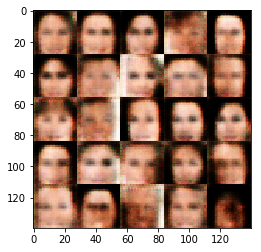

Epoch 1/2... Discriminator Loss: 0.9084... Generator Loss: 0.6885


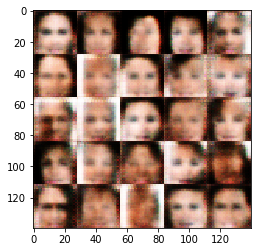

Epoch 1/2... Discriminator Loss: 0.9079... Generator Loss: 0.6901


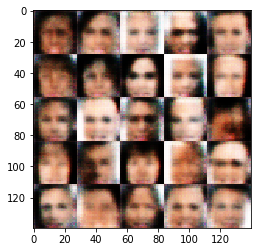

Epoch 1/2... Discriminator Loss: 0.9158... Generator Loss: 0.6845


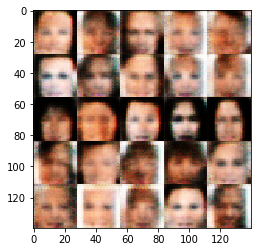

Epoch 1/2... Discriminator Loss: 0.9144... Generator Loss: 0.6863


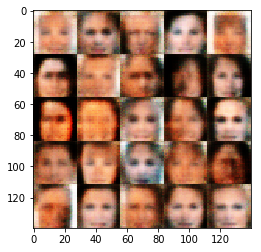

Epoch 1/2... Discriminator Loss: 0.9131... Generator Loss: 0.6891


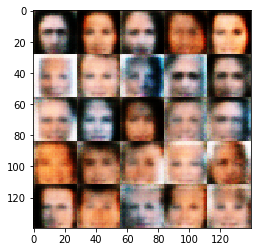

Epoch 1/2... Discriminator Loss: 0.9515... Generator Loss: 0.6703


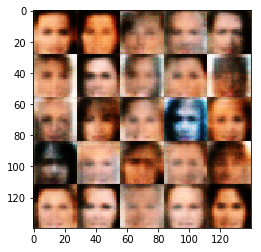

Epoch 1/2... Discriminator Loss: 0.9499... Generator Loss: 0.6304


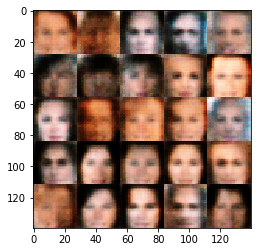

Epoch 1/2... Discriminator Loss: 0.9731... Generator Loss: 0.6248


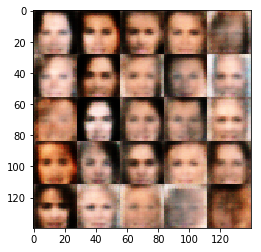

Epoch 1/2... Discriminator Loss: 0.9346... Generator Loss: 0.6545


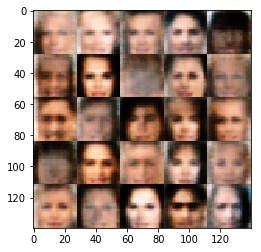

Epoch 1/2... Discriminator Loss: 0.9688... Generator Loss: 0.6492


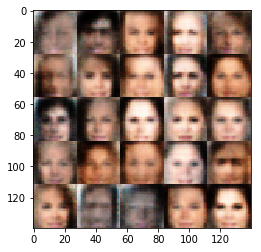

Epoch 1/2... Discriminator Loss: 0.9660... Generator Loss: 0.6588


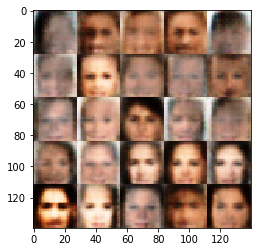

Epoch 1/2... Discriminator Loss: 0.9413... Generator Loss: 0.6686


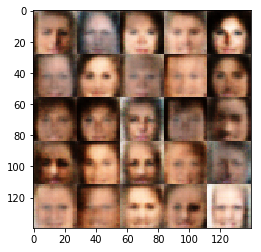

Epoch 1/2... Discriminator Loss: 0.9986... Generator Loss: 0.6399


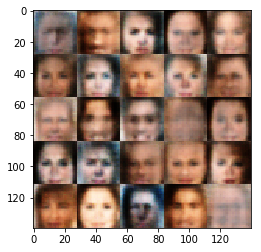

Epoch 1/2... Discriminator Loss: 0.9851... Generator Loss: 0.6276


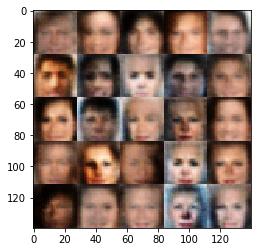

Epoch 1/2... Discriminator Loss: 1.0091... Generator Loss: 0.6297


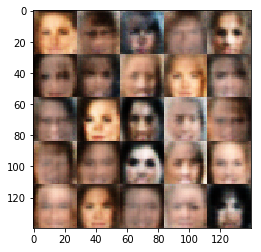

Epoch 1/2... Discriminator Loss: 1.0241... Generator Loss: 0.6398


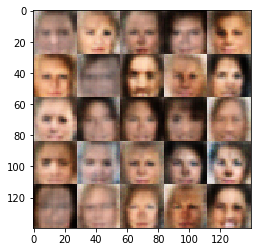

Epoch 1/2... Discriminator Loss: 0.9955... Generator Loss: 0.6429


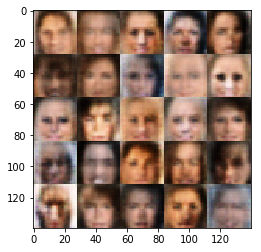

Epoch 2/2... Discriminator Loss: 1.0262... Generator Loss: 0.6287


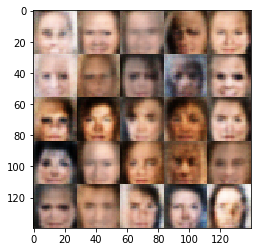

Epoch 2/2... Discriminator Loss: 0.9867... Generator Loss: 0.6452


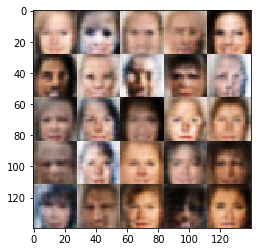

Epoch 2/2... Discriminator Loss: 1.0276... Generator Loss: 0.6113


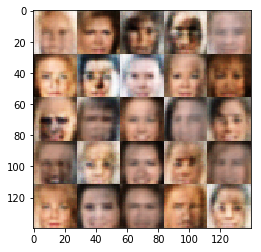

Epoch 2/2... Discriminator Loss: 1.1345... Generator Loss: 0.5448


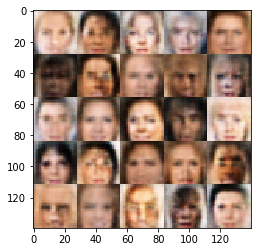

Epoch 2/2... Discriminator Loss: 1.0373... Generator Loss: 0.5949


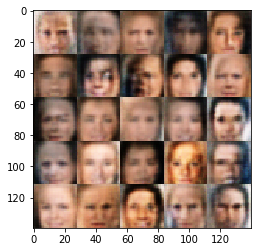

Epoch 2/2... Discriminator Loss: 1.0754... Generator Loss: 0.5949


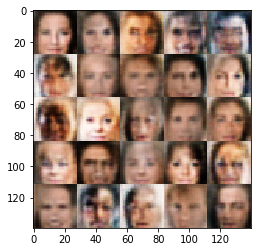

Epoch 2/2... Discriminator Loss: 1.0565... Generator Loss: 0.6108


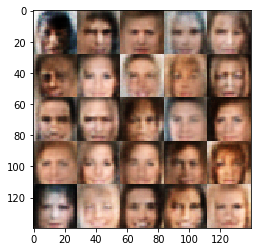

Epoch 2/2... Discriminator Loss: 1.0828... Generator Loss: 0.6200


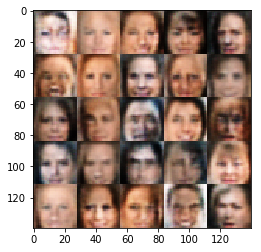

Epoch 2/2... Discriminator Loss: 1.0872... Generator Loss: 0.5928


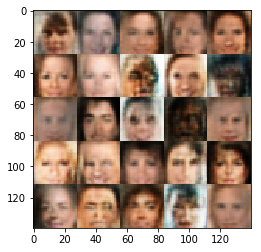

Epoch 2/2... Discriminator Loss: 1.1012... Generator Loss: 0.5524


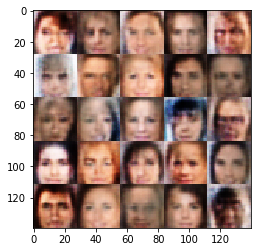

Epoch 2/2... Discriminator Loss: 1.0994... Generator Loss: 0.5807


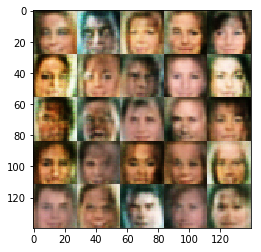

Epoch 2/2... Discriminator Loss: 1.0285... Generator Loss: 0.6201


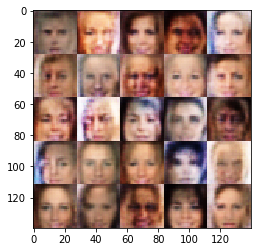

Epoch 2/2... Discriminator Loss: 1.0656... Generator Loss: 0.6156


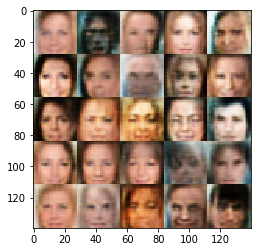

Epoch 2/2... Discriminator Loss: 1.0759... Generator Loss: 0.6038


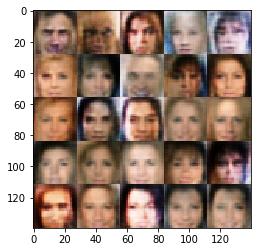

Epoch 2/2... Discriminator Loss: 1.0901... Generator Loss: 0.6108


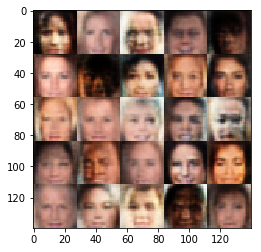

Epoch 2/2... Discriminator Loss: 1.0761... Generator Loss: 0.6002


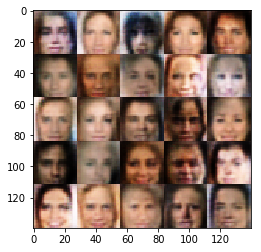

Epoch 2/2... Discriminator Loss: 1.0558... Generator Loss: 0.6187


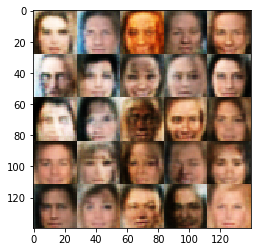

Epoch 2/2... Discriminator Loss: 1.0583... Generator Loss: 0.6011


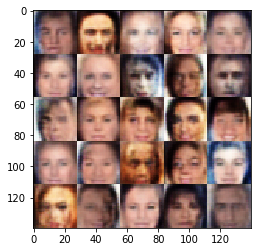

Epoch 2/2... Discriminator Loss: 1.0782... Generator Loss: 0.5779


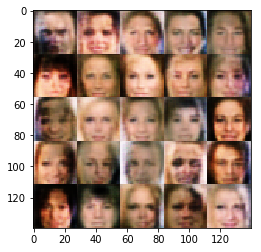

Epoch 2/2... Discriminator Loss: 1.0957... Generator Loss: 0.5792


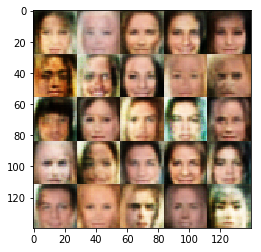

Epoch 2/2... Discriminator Loss: 1.0717... Generator Loss: 0.5733


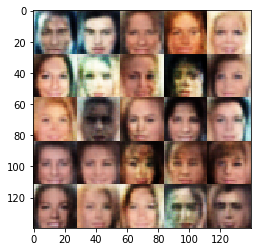

Epoch 2/2... Discriminator Loss: 1.1414... Generator Loss: 0.5948


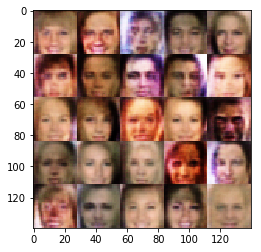

Epoch 2/2... Discriminator Loss: 1.0669... Generator Loss: 0.5735


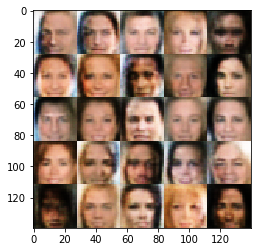

Epoch 2/2... Discriminator Loss: 1.0777... Generator Loss: 0.5962


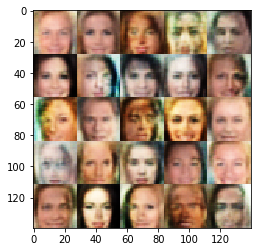

Epoch 2/2... Discriminator Loss: 1.1328... Generator Loss: 0.5849


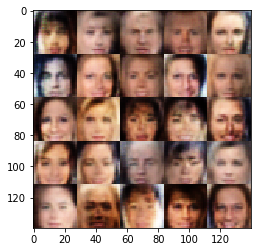

Epoch 2/2... Discriminator Loss: 1.1148... Generator Loss: 0.5476


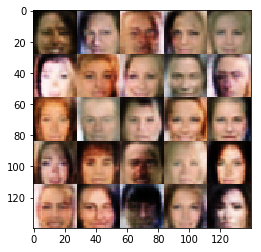

Epoch 2/2... Discriminator Loss: 1.1118... Generator Loss: 0.5938


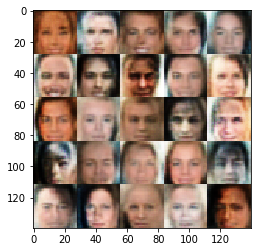

Epoch 2/2... Discriminator Loss: 1.0657... Generator Loss: 0.6032


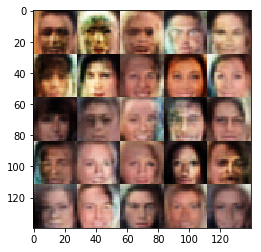

Epoch 2/2... Discriminator Loss: 1.0514... Generator Loss: 0.6059


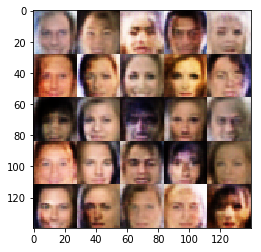

Epoch 2/2... Discriminator Loss: 1.0705... Generator Loss: 0.6217


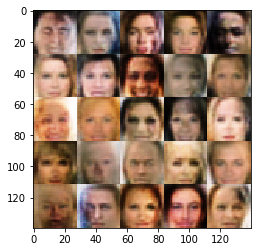

Epoch 2/2... Discriminator Loss: 1.1584... Generator Loss: 0.5467


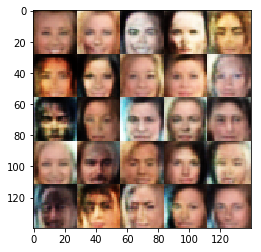

Epoch 2/2... Discriminator Loss: 1.0926... Generator Loss: 0.5725


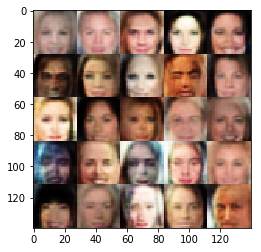

Epoch 2/2... Discriminator Loss: 1.0730... Generator Loss: 0.5891


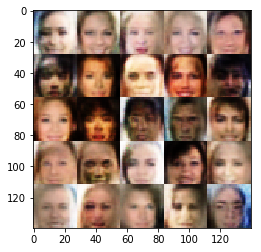

Epoch 2/2... Discriminator Loss: 1.1144... Generator Loss: 0.5833


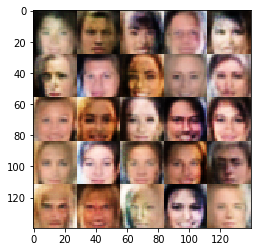

Epoch 2/2... Discriminator Loss: 1.1024... Generator Loss: 0.5804


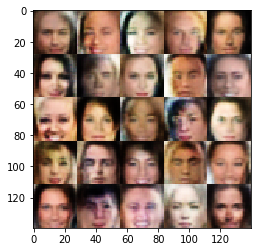

Epoch 2/2... Discriminator Loss: 1.0553... Generator Loss: 0.6005


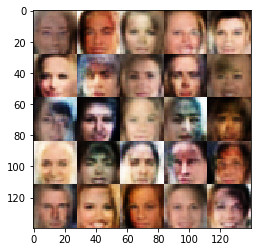

Epoch 2/2... Discriminator Loss: 1.1133... Generator Loss: 0.5455


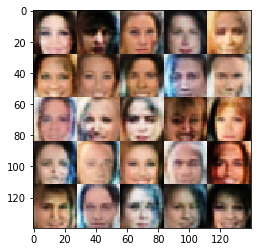

Epoch 2/2... Discriminator Loss: 1.1135... Generator Loss: 0.5695


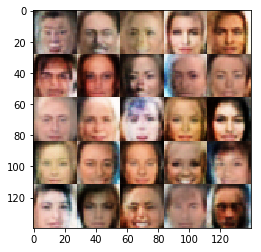

Epoch 2/2... Discriminator Loss: 1.2070... Generator Loss: 0.5616


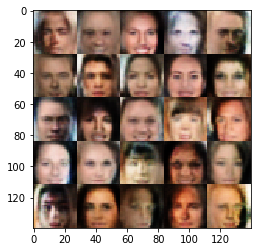

Epoch 2/2... Discriminator Loss: 1.1136... Generator Loss: 0.5681


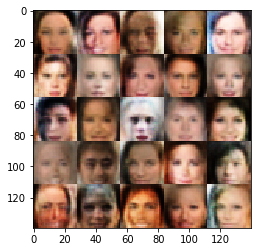

Epoch 2/2... Discriminator Loss: 1.0320... Generator Loss: 0.6339


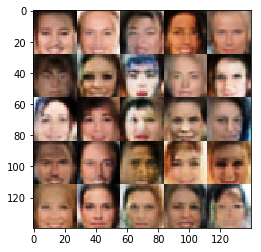

Epoch 2/2... Discriminator Loss: 1.0958... Generator Loss: 0.5995


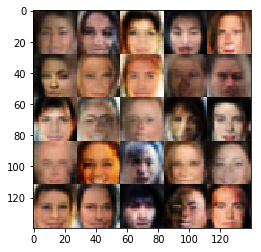

Epoch 2/2... Discriminator Loss: 1.1502... Generator Loss: 0.5604


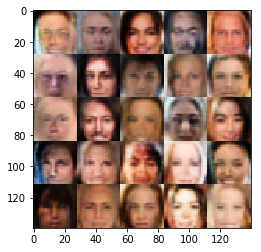

Epoch 2/2... Discriminator Loss: 1.1265... Generator Loss: 0.5641


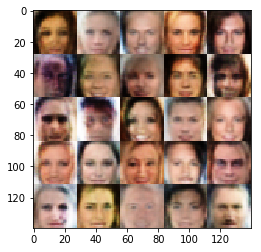

Epoch 2/2... Discriminator Loss: 1.0501... Generator Loss: 0.6221


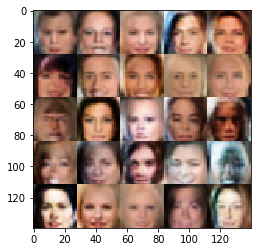

Epoch 2/2... Discriminator Loss: 1.1190... Generator Loss: 0.5651


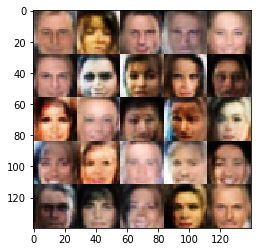

Epoch 2/2... Discriminator Loss: 1.1290... Generator Loss: 0.5740


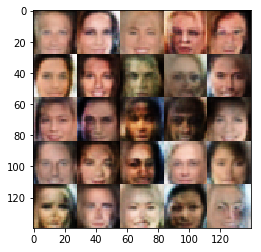

Epoch 2/2... Discriminator Loss: 1.1245... Generator Loss: 0.5831


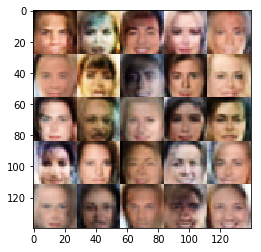

Epoch 2/2... Discriminator Loss: 1.1758... Generator Loss: 0.5388


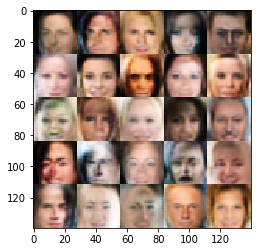

Epoch 2/2... Discriminator Loss: 1.1284... Generator Loss: 0.5949


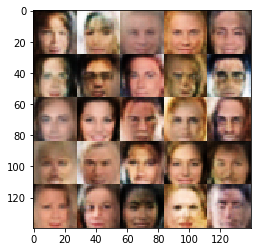

Epoch 2/2... Discriminator Loss: 1.0811... Generator Loss: 0.6010


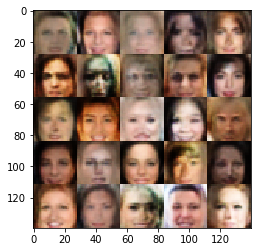

Epoch 2/2... Discriminator Loss: 1.0719... Generator Loss: 0.5760


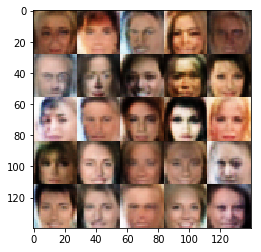

Epoch 2/2... Discriminator Loss: 1.0554... Generator Loss: 0.6052


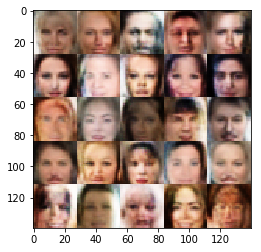

Epoch 2/2... Discriminator Loss: 1.0951... Generator Loss: 0.5547


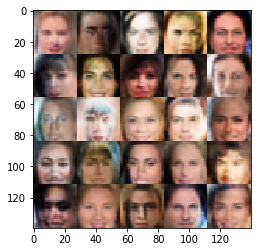

Epoch 2/2... Discriminator Loss: 1.0673... Generator Loss: 0.6096


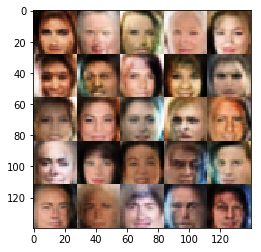

Epoch 2/2... Discriminator Loss: 1.0489... Generator Loss: 0.6053


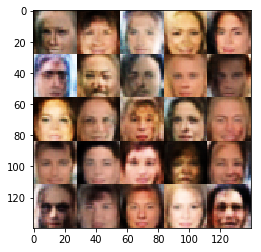

Epoch 2/2... Discriminator Loss: 1.0865... Generator Loss: 0.5988


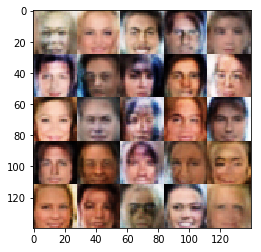

Epoch 2/2... Discriminator Loss: 1.1715... Generator Loss: 0.5275


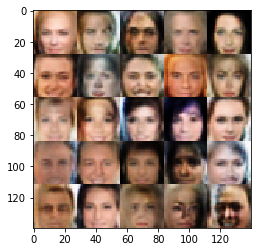

Epoch 2/2... Discriminator Loss: 1.0708... Generator Loss: 0.5983


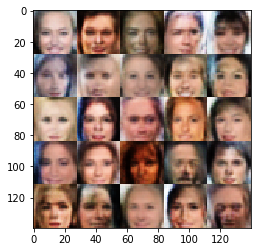

Epoch 2/2... Discriminator Loss: 1.0869... Generator Loss: 0.5749


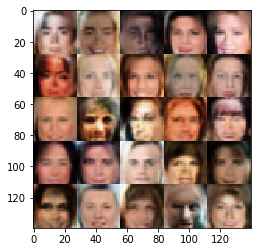

Epoch 2/2... Discriminator Loss: 1.0885... Generator Loss: 0.5992


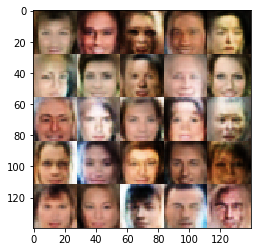

Epoch 2/2... Discriminator Loss: 1.0500... Generator Loss: 0.5992


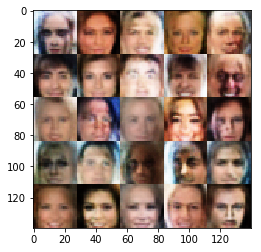

Epoch 2/2... Discriminator Loss: 1.0979... Generator Loss: 0.5721


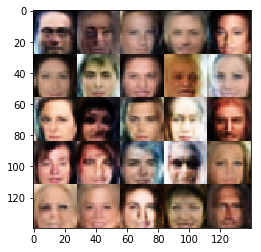

In [12]:
batch_size = 32
z_dim = 100
learning_rate = 0.00001
beta1 = 0.1


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.